In [61]:
import cv2
import keras
import numpy as np
import pandas as pd
import seaborn as sns
import tensorflow as tf
from scipy.ndimage import zoom
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
from sklearn.metrics import cohen_kappa_score
from sklearn.utils.class_weight import compute_class_weight
from tensorflow.keras.applications.resnet50 import preprocess_input
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from keras.layers import GlobalAveragePooling2D, Dropout, Dense
from keras.callbacks import ModelCheckpoint, LearningRateScheduler, EarlyStopping, ReduceLROnPlateau


In [7]:
# Check if GPU is available
gpu_devices = tf.config.experimental.list_physical_devices('GPU')
if len(gpu_devices) > 0:
    print("GPU is available")
    print("GPU devices:", gpu_devices)
else:
    print("GPU is not available. Training on CPU.")


GPU is available
GPU devices: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


# ResNet152V2 training - not preprocecced Images

Pulling ResNet152V2 pre-trained on ImageNet for feature extraction. The top classification layer of the pre-trained model is excluded, and a new classification head is added with a Global Average Pooling layer followed by a Dense layer with a softmax activation for 5-class classification. The weights of the pre-trained ResNet152V2 are frozen, and the entire model is compiled for training.







In [8]:
inputs = keras.layers.Input(shape=(224, 224, 3))
model = keras.applications.ResNet152V2(include_top=False, input_tensor=inputs, weights="imagenet")

# Freeze the pretrained weights
model.trainable = False

# Rebuild top
x = keras.layers.GlobalAveragePooling2D(name="avg_pool")(model.output)
x = keras.layers.BatchNormalization()(x)

top_dropout_rate = 0.2
x = keras.layers.Dropout(top_dropout_rate, name="top_dropout")(x)
outputs = keras.layers.Dense(5, activation="softmax", name="pred")(x)

# Compile
model = keras.Model(inputs, outputs, name="ResNet152V2")
# optimizer = keras.optimizers.Adam(learning_rate=1e-2)

In [5]:
model.compile(loss='binary_crossentropy', optimizer=keras.optimizers.Adam(lr=0.00005), metrics=['accuracy'])
model.summary()

Model: "ResNet152V2"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 230, 230, 3)          0         ['input_1[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 112, 112, 64)         9472      ['conv1_pad[0][0]']           
                                                                                                  
 pool1_pad (ZeroPadding2D)   (None, 114, 114, 64)         0         ['conv1_conv[0][0]']          
                                                                                        

We end up having 10245 parameters to train from total 58341893 parameters.

Using ImageDataGenerator from Keras for data augmentation.
The images are resized to (224, 224), batch size is set to 32, and the class mode is categorical for multi-class classification. The training and validation data are split using the validation_split parameter. The paths specified indicate the location of the image data.

Found 3265 images belonging to 5 classes.


Found 815 images belonging to 5 classes.
Found 4080 images belonging to 5 classes.


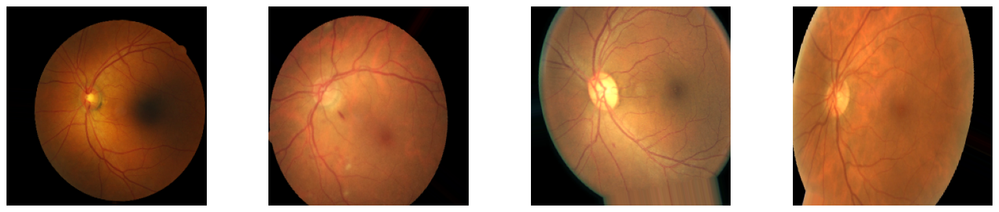

In [92]:
datagen = ImageDataGenerator(rotation_range=40,
                                      zoom_range=0.2,
                                      width_shift_range=0.1,
                                      height_shift_range=0.1,
                                      validation_split=0.2,
                                      horizontal_flip = True,
                                      vertical_flip = True,
                                      brightness_range=(1,1.2),
                                      fill_mode='nearest',
                                      )
# datagen=tf.keras.preprocessing.image.ImageDataGenerator(
#     featurewise_center=True,
#     samplewise_center=True,
#     featurewise_std_normalization=True,
#     samplewise_std_normalization=False,
#     zca_whitening=True,
#     zca_epsilon=1e-06,
#     rotation_range=0,
#     width_shift_range=0.0,
#     height_shift_range=0.0,
#     brightness_range=None,
#     shear_range=0.0,
#     zoom_range=0.0,
#     channel_shift_range=0.0,
#     fill_mode='nearest',
#     cval=0.0,
#     horizontal_flip=True,
#     vertical_flip=True,
#     rescale=None,
#     preprocessing_function=None,
#     data_format=None,
#     validation_split=0.0,
#     interpolation_order=1,
# )
# Training data
train_data = datagen.flow_from_directory(
    'DR_data_cropped_classes/train',
    target_size=(224, 224),
    batch_size=8,
    class_mode='categorical',
    subset='training'  # This is the training subset
)

# Validation data
validation_data = datagen.flow_from_directory(
    'DR_data_cropped_classes/train',
    target_size=(224, 224),
    batch_size=8,
    class_mode='categorical',
    subset='validation'  # This is the validation subset
)
fig, ax = plt.subplots(nrows=1, ncols=4, figsize=(20,4))
it = 0
for x, y in datagen.flow_from_directory( 'DR_data_cropped_classes/train'):
    ax[it].imshow((x[0]).astype('uint8'))
    ax[it].axis('off')
    it += 1
    if it == 4:
        break


defining a function callbacks that sets up a list of Keras callbacks for training a neural network model. The callbacks include:

ModelCheckpoint: Saves the model weights when validation loss is minimized.
ReduceLROnPlateau: Adjusts the learning rate when the validation loss plateaus.
EarlyStopping: Stops training if there is no improvement in the validation loss after a certain patience period.
The function takes a model_name parameter to generate a unique filename for saving the best weights. The callbacks list is then returned for use during model training.

In [10]:
def callbacks(model_name:str):
  weight_path="{}_weights.best.hdf5".format(model_name)

  checkpoint = ModelCheckpoint(weight_path, monitor='val_loss', verbose=1,
                              save_best_only=True, mode='min', save_weights_only = True)

 # Adjusted ReduceLROnPlateau with lower initial learning rate
  reduce_lr = ReduceLROnPlateau(
      monitor='val_loss',  # Monitor validation loss
      factor=0.5,           # Reduce learning rate by half (you can experiment with this value)
      patience=2,           # Number of epochs with no improvement after which learning rate will be reduced
      verbose=1,
      mode='auto',
      epsilon=0.0001,
      cooldown=2,           # Number of epochs to wait before resuming normal operation after reducing learning rate
      min_lr=0.00001         # Lower initial learning rate
  )
  early = EarlyStopping(monitor="val_loss",
                        mode="min",
                        patience=6)
  callbacks_list = [checkpoint, early, reduce_lr]
  return callbacks_list

In [11]:
callbacks_list=callbacks('ResNet152V2')

In [9]:
history_ResNet152V2=model.fit_generator(train_data,
                    epochs=30,
                    initial_epoch=0,
                    verbose=1,
                    validation_data=validation_data,
                    callbacks=callbacks_list)

<ipython-input-9-34769e71351d>:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history_ResNet152V2=model.fit_generator(train_data,


Epoch 1/30
409/409 [==============================] - ETA: 0s - loss: 0.5936 - accuracy: 0.2018
Epoch 1: val_loss improved from inf to 0.57140, saving model to ResNet152V2_weights.best.hdf5
409/409 [==============================] - 1113s 3s/step - loss: 0.5936 - accuracy: 0.2018 - val_loss: 0.5714 - val_accuracy: 0.2294 - lr: 0.0010
Epoch 2/30
409/409 [==============================] - ETA: 0s - loss: 0.5702 - accuracy: 0.2116
Epoch 2: val_loss improved from 0.57140 to 0.55210, saving model to ResNet152V2_weights.best.hdf5
409/409 [==============================] - 116s 284ms/step - loss: 0.5702 - accuracy: 0.2116 - val_loss: 0.5521 - val_accuracy: 0.2380 - lr: 0.0010
Epoch 3/30
409/409 [==============================] - ETA: 0s - loss: 0.5595 - accuracy: 0.2361
Epoch 3: val_loss improved from 0.55210 to 0.53954, saving model to ResNet152V2_weights.best.hdf5
409/409 [==============================] - 118s 287ms/step - loss: 0.5595 - accuracy: 0.2361 - val_loss: 0.5395 - val_accuracy: 

KeyboardInterrupt: 

In [3]:
def plot_loss_curves(results):
    results= pd.DataFrame(results.history)
    loss = results["loss"]
    val_loss = results["val_loss"]

    accuracy = results["accuracy"]
    val_accuracy = results["val_accuracy"]

    epochs = range(len(results["loss"]))

    plt.figure(figsize=(15, 7))

    # Plot loss
    plt.subplot(1, 2, 1)
    plt.plot(epochs, loss, label="loss")
    plt.plot(epochs, val_loss, label="val_loss")
    plt.title("Loss")
    plt.xlabel("Epochs")
    plt.legend()

    # Plot accuracy
    plt.subplot(1, 2, 2)
    plt.plot(epochs, accuracy, label="val_accuracy")
    plt.plot(epochs, val_accuracy, label="")
    plt.title("Accuracy")
    plt.xlabel("Epochs")
    plt.legend()

In [ ]:
plot_loss_curves(history_ResNet152V2)

In [93]:
test_datagen = ImageDataGenerator()

test_data = test_datagen.flow_from_directory('DR_data_cropped_classes/test',
                                                     target_size=(224,224),
                                                     batch_size=8,
                                                     class_mode = 'categorical',
                                                     )


Found 500 images belonging to 5 classes.


In [ ]:
evaluation_result = model.evaluate(test_data)
# Display the evaluation result
print("Test Loss:", evaluation_result[0])
print("Test Accuracy:", evaluation_result[1])

## Fine-tuning

In [ ]:
model.trainable = True
model.summary(show_trainable=True)

model.compile(loss='binary_crossentropy', optimizer=keras.optimizers.Adam(lr=0.00005), metrics=['accuracy'])
epochs = 5
print("Fitting the end-to-end model")
model.fit(train_data, epochs=epochs, validation_data=validation_data,callbacks=callbacks_list)

In [ ]:
print("Test dataset evaluation")
model.evaluate(test_data)

Test dataset evaluation
16/16 [==============================] - 6s 345ms/step - loss: 0.4191 - binary_accuracy: 0.8100


[0.4191281497478485, 0.8100000023841858]

**The results of the ResNet152V2 are not promising**

## EfficientNetB7

In [59]:
def GAP2D():
    '''Global average pooling layer'''
    global_average_pooling = GlobalAveragePooling2D()
    return global_average_pooling
def dropout(value = 0.5):
    '''Dropout layer'''
    dropout_layer = Dropout(value)
    return dropout_layer
def dense():
    '''Dense layer'''
    dense_layer = Dense(5, activation='sigmoid')
    return dense_layer

In [60]:
global_average_pooling_layer = GAP2D()
dropout_layer = dropout()
dense_layer = dense()

In [64]:
# inputs = keras.layers.Input(shape=(224, 224, 3))
# model = keras.applications.EfficientNetB7(include_top=False, input_tensor=inputs, weights="imagenet")

# # Freeze the pretrained weights
# model.trainable = False

# # Rebuild top
# x = keras.layers.GlobalAveragePooling2D(name="avg_pool")(model.output)
# x = keras.layers.BatchNormalization()(x)

# top_dropout_rate = 0.2
# x = keras.layers.Dropout(top_dropout_rate, name="top_dropout")(x)
# outputs = keras.layers.Dense(5, activation="softmax", name="pred")(x)

# Compile
# model = keras.Model(inputs, outputs, name="EfficientNet")
# optimizer = keras.optimizers.Adam(learning_rate=1e-2)

efficientnet_ = keras.applications.EfficientNetB7(weights = 'imagenet',include_top = False, input_shape = (224, 224, 3) )
x = global_average_pooling_layer(efficientnet_.layers[-1].output)
x = dropout_layer(x)
output = dense_layer(x)
model = keras.Model(efficientnet_.layers[0].input,output,name='EfficientNetB7')
model.compile(loss='binary_crossentropy', optimizer=keras.optimizers.Adam(lr=0.00005), metrics=['accuracy'])


In [65]:
model.summary()

Model: "EfficientNetB7"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_6 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 rescaling_2 (Rescaling)     (None, 224, 224, 3)          0         ['input_6[0][0]']             
                                                                                                  
 normalization_1 (Normaliza  (None, 224, 224, 3)          7         ['rescaling_2[0][0]']         
 tion)                                                                                            
                                                                                                  
 rescaling_3 (Rescaling)     (None, 224, 224, 3)          0         ['normalization_1

In [18]:
EfficientNetB7=callbacks('EfficientNetB7')

In [19]:
EfficientNetB7=model.fit_generator(train_data,validation_data = validation_data,callbacks=callbacks_list,epochs=20,verbose=1)

<ipython-input-19-11a2c1ac8eed>:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  EfficientNetB7=model.fit_generator(train_data,validation_data = validation_data,callbacks=callbacks_list,epochs=20,verbose=1)


Epoch 1/20
409/409 [==============================] - ETA: 0s - loss: 0.4705 - accuracy: 0.3516
Epoch 1: val_loss did not improve from 0.50512
409/409 [==============================] - 376s 566ms/step - loss: 0.4705 - accuracy: 0.3516 - val_loss: 1.6783 - val_accuracy: 0.2540 - lr: 0.0010
Epoch 2/20
409/409 [==============================] - ETA: 0s - loss: 0.4350 - accuracy: 0.3930
Epoch 2: val_loss improved from 0.50512 to 0.43794, saving model to ResNet152V2_weights.best.hdf5
409/409 [==============================] - 237s 580ms/step - loss: 0.4350 - accuracy: 0.3930 - val_loss: 0.4379 - val_accuracy: 0.3767 - lr: 0.0010
Epoch 3/20
409/409 [==============================] - ETA: 0s - loss: 0.4255 - accuracy: 0.4205
Epoch 3: val_loss improved from 0.43794 to 0.40903, saving model to ResNet152V2_weights.best.hdf5
409/409 [==============================] - 235s 574ms/step - loss: 0.4255 - accuracy: 0.4205 - val_loss: 0.4090 - val_accuracy: 0.4294 - lr: 0.0010
Epoch 4/20
409/409 [=====

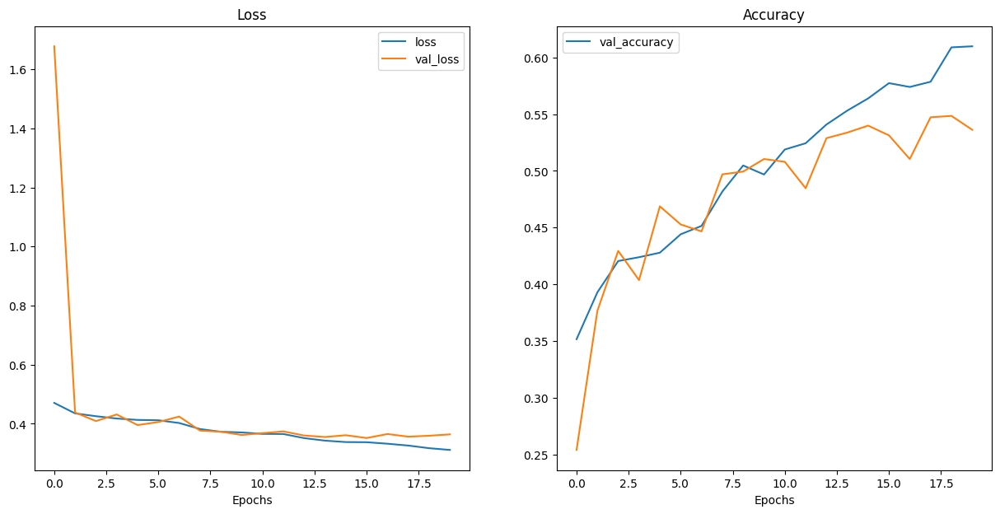

In [20]:
plot_loss_curves(EfficientNetB7)

## Training VGG19 on processed data

In [96]:
x_train = np.load("processed_images/training.npy", mmap_mode=None, allow_pickle=False, fix_imports=True)
x_validation = np.load("processed_images/validation.npy",mmap_mode=None, allow_pickle=False, fix_imports=True)
x_test = np.load("processed_images/test.npy",mmap_mode=None, allow_pickle=False, fix_imports=True)
print("Loaded Successfully...\n")
print(x_train.shape)
print(x_validation.shape)
print(x_test.shape)


Loaded Successfully...

(3468, 224, 224, 3)
(612, 224, 224, 3)
(500, 224, 224, 3)


In [97]:
train_data=pd.read_pickle("train_data.pkl")
validation_data=pd.read_pickle("validation_data.pkl")
test_data=pd.read_pickle("test_data.pkl")
train_labels = train_data['stage'].astype('int')
validation_labels = validation_data['stage'].astype('int')
test_labels = test_data['stage'].astype('int')
print("Training:",train_labels.shape[0])
print("validation:",validation_labels.shape[0])
print("test:",test_labels.shape[0])

Training: 3468
validation: 612
test: 500


In [98]:
x_train.shape

(3468, 224, 224, 3)

# One Hot Encoding for DataFrame


In [99]:
def kappa_metric(y_true, y_pred):
    """
    This function is used for calculating kappa score between the model predicted values and true values
    Args: y_true (np.ndarray or list) - true values
          y_pred (np.ndarray or list) - model predicted value
    Output: _kappa_ (integer or float) - return's kappa score
    """
    y_true = y_true.sum(axis=1) - 1
    y_pred = y_pred > 0.5
    y_pred = y_pred.astype(int).sum(axis=1) - 1
    _kappa_ = cohen_kappa_score( y_true, y_pred,  weights='quadratic' )
    return _kappa_

In [100]:
y_train=train_labels.values
y_validation = validation_labels.values
y_test= test_labels.values

y_train=tf.one_hot(y_train,5)
y_validation=tf.one_hot(y_validation,5)
y_test=tf.one_hot(y_test,5)

In [101]:
class_weights = compute_class_weight('balanced', classes=[0, 1, 2, 3, 4], y=train_labels.values)


In [102]:
def kappa_metric(y_true, y_pred):
    """
    This function is used for calculating kappa score between the model predicted values and true values
    Args: y_true (np.ndarray or list) - true values
          y_pred (np.ndarray or list) - model predicted value
    Output: _kappa_ (integer or float) - return's kappa score
    """
    y_true = y_true.sum(axis=1) - 1
    y_pred = y_pred > 0.5
    y_pred = y_pred.astype(int).sum(axis=1) - 1
    _kappa_ = cohen_kappa_score( y_true, y_pred,  weights='quadratic' )
    return _kappa_

In [103]:
class PerformanceMetric:
    def __init__(self,actual_labels,predicted_labels):
        ''' Initialization of variables '''
        self.actual_labels = actual_labels
        self.predicted_labels = predicted_labels
    def single_value_conversion(self):
        ''' This function is used for Converting model predicted values into single values
           Ex: model_predicted_value: [0,1,0,0,0] and it converts as 1'''
        predicted_labels = self.predicted_labels > 0.5
        prediction_ordinal = np.empty(predicted_labels.shape, dtype = int)
        prediction_ordinal[:,4] = predicted_labels[:,4]
        for i in range(3, -1, -1): prediction_ordinal[:, i] = np.logical_or(predicted_labels[:,i], prediction_ordinal[:,i+1])
        self.predicted_labels = prediction_ordinal.sum(axis = 1)-1
        self.actual_labels = self.actual_labels.sum(axis = 1)-1
    def confusionMatrix(self):
        ''' This function is used for calculating confusion matrix between model predicted values and true values using sklearn implementation.'''
        confusion_matrix_ = confusion_matrix(self.actual_labels, self.predicted_labels)
        return confusion_matrix_
    def precision(self, matrix):
        ''' This function is used for calculating precision matrix between predicted values and true values using confusion matrix'''
        precision_matrix =(((matrix.T)/(matrix.sum(axis=1))).T)
        return precision_matrix
    def recall(self, matrix):
        ''' this function is used for calculating recall matrix between predicted values and true values using confusion matrix'''
        recall_matrix =(matrix/matrix.sum(axis=0))
        return recall_matrix
    def subplot_(self, matrix, i, title):
        ''' This function is used for subplots'''
        plt.subplot(1,3,i)
        labels = [1,2,3,4,5]
        sns.heatmap(matrix, annot=True, cmap=sns.light_palette('green'),linewidths = 0.8,cbar = False, fmt=".3f", xticklabels=labels, yticklabels=labels)
        plt.title(title)
        plt.xlabel('Predicted Class Labels')
        plt.ylabel('Actual Class Labels')
    def plotting(self):
        """
        This function is used for calculating number of misclassified points, confusion, recall and precision matrixes and plotting it using subplots.
        """
        self.single_value_conversion()
        confusion_matrix = self.confusionMatrix()
        #print("Number of misclassified points: ",(len(self.actual_labels)-np.trace(confusion_matrix))/len(self.actual_labels)*100,"\n")
        precision_matrix = self.precision(confusion_matrix)
        recall_matrix = self.recall(confusion_matrix)
        plt.figure(figsize=(20,5))
        self.subplot_(confusion_matrix, 1, 'Confusion Matrix')
        self.subplot_(precision_matrix, 2, 'Precision')
        self.subplot_(recall_matrix, 3, 'Recall')
        plt.show()

In [104]:
def test_prediction(predicted_labels):
    '''
    Making predictions of the probability scores. The class with more score will be taken as predicted class.
    Arguments:
    predicted_labels - (np.array) - probability score of given sample
    '''
    predicted_labels = predicted_labels > 0.5
    prediction_ordinal = np.empty(predicted_labels.shape, dtype = int)
    prediction_ordinal[:,4] = predicted_labels[:,4]
    for i in range(3, -1, -1): prediction_ordinal[:, i] = np.logical_or(predicted_labels[:,i], prediction_ordinal[:,i+1])
    predicted_labels = prediction_ordinal.sum(axis = 1)-1
    return predicted_labels

In [ ]:
!pip install git+https://github.com/qubvel/segmentation_models

  Cloning https://github.com/qubvel/segmentation_models to /tmp/pip-req-build-3s8taia0
  Running command git clone --filter=blob:none --quiet https://github.com/qubvel/segmentation_models /tmp/pip-req-build-3s8taia0
  Resolved https://github.com/qubvel/segmentation_models to commit e951c6747f75fa9e7240816d1c79dd2e66813123
  Running command git submodule update --init --recursive -q
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.7/50.7 kB 918.9 kB/s eta 0:00:00
  Created wheel for segmentation-models: filename=segmentation_models-1.0.1-py3-none-any.whl size=33788 sha256=bf559d7c404d78da0826bd44a075eef3d73ffc9dacfba713d314ecb4d32196db
  Stored in directory: /tmp/pip-ephem-wheel-cache-3tacjayb/wheels/ce/d6/f1/5d00e82b3893c5f1ffee43bf7b8877148af09c7c9c6c4882c9
Successfully built segmentation-models


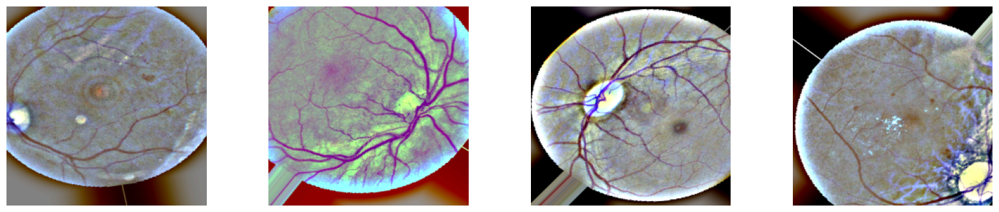

In [105]:
fig, ax = plt.subplots(nrows=1, ncols=4, figsize=(20,4))
it = 0
for x, y in datagen.flow(x_train,y_train):
    ax[it].imshow((x[0]).astype('uint8'))
    ax[it].axis('off')
    it += 1
    if it == 4:
        break

batch_size =  32

data_generator = datagen.flow(x_train,
                              y_train,
                              batch_size=batch_size,
                              seed=32)

In [ ]:
def VGG19_(top_6 = False):
    '''This function is used for building a model architecture of pretrained Vgg19 on imagenet data set.'''
    vgg = keras.applications.VGG19(weights = 'imagenet', include_top = False, input_shape = (224,224,3))
    if not top_6:
        for layer in vgg.layers:
            layer.trainable = False
    else:
         for layer in vgg.layers[:13]:
            layer.trainable=False
    x = global_average_pooling_layer(vgg.layers[-1].output)
    x = dropout_layer(x)
    output = dense_layer(x)
    model = keras.Model(vgg.layers[0].input,output)
    model.compile(loss='binary_crossentropy', optimizer=keras.optimizers.Adam(lr=0.00005), metrics=['accuracy'])
    return model

    # vgg = keras.applications.VGG19(weights = 'imagenet', include_top = False, input_shape = (224,224,3))
    # for layer in vgg.layers:
    #     layer.trainable = False

    # x = global_average_pooling_layer(vgg.layers[-1].output)
    # x = dropout_layer(x)
    # output = dense_layer(x)
    # model = keras.Model(vgg.layers[0].input,output)
    # model.compile(loss='binary_crossentropy', optimizer=keras.optimizers.Adam(lr=0.00005), metrics=['accuracy'])
    # return model


In [ ]:
vgg19 = VGG19_(top_6 =True)
vgg19.summary()


# Advantage
**within these settings with the processed images, the training is way more faster.**

In [ ]:
callbacks_list=callbacks('vgg19')

In [ ]:
class_weight_dict = dict(enumerate(class_weights))
vgg19_model = vgg19.fit_generator(
                   datagen.flow(x_train, y_train, batch_size=8),
                    steps_per_epoch=len(x_train) / 8,
                    epochs=50,
                    initial_epoch=0,
                    verbose=1,
                    validation_data=(x_validation, y_validation),
                    validation_steps=len(x_validation) / 8,
                    callbacks=callbacks_list, class_weight = class_weight_dict)

In [ ]:
plot_loss_curves(vgg19_model)

In [ ]:
result1 = vgg19.evaluate(x_test,y_test, verbose = 2)
print(result1)
y_pred = vgg19.predict(x_test, batch_size = 8)

In [ ]:
ytrain_vgg19 = vgg19.predict(x_train)
ytrain_vgg19 = test_prediction(ytrain_vgg19)
print("First five data points predictions in training:",ytrain_vgg19[:5])
print("length of traindata prediction:",ytrain_vgg19.shape,"\n")

yvalidation_vgg19 = vgg19.predict(x_validation)
yvalidation_vgg19 = test_prediction(yvalidation_vgg19)
print("First five data points predictions in validation:",yvalidation_vgg19[:5])
print("length of validation data prediction:",yvalidation_vgg19.shape,"\n")

ytest_vgg19 = vgg19.predict(x_test)
ytest_vgg19 = test_prediction(ytest_vgg19)
print("First five data points predictions in test:",ytest_vgg19[:5])
print("length of test data prediction:",ytest_vgg19.shape)

In [ ]:
y_test = np.array(y_test)
y_pred = np.array(y_pred)
metric = PerformanceMetric(y_test, y_pred)
metric.plotting()

## Load model fine tuned ResNet152V2


In [51]:
inputs = keras.Input(shape=(224, 224, 3))
base_model = keras.applications.ResNet152V2(
    weights='imagenet',  # Load weights pre-trained on ImageNet.
    input_shape=(224, 224, 3),input_tensor=inputs,
    include_top=False)  # Do not include the ImageNet classifier at the top.


# We make sure that the base_model is running in inference mode here,
# by passing `training=False`.

x = base_model(inputs, training=False)
# Convert features of shape `base_model.output_shape[1:]` to vectors
x = keras.layers.GlobalAveragePooling2D()(x)
# A Dense classifier with a single unit (binary classification)
outputs = keras.layers.Dense(5, activation='softmax')(x)
model = keras.Model(inputs, outputs)
model.compile(optimizer=keras.optimizers.Adam(),
              loss=keras.losses.BinaryCrossentropy(from_logits=True),
              metrics=[keras.metrics.BinaryAccuracy()])

model.load_weights(filepath="ResNet152V2_weights.best.hdf5")
model.summary()

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 resnet152v2 (Functional)    (None, 7, 7, 2048)        58331648  
                                                                 
 global_average_pooling2d_2  (None, 2048)              0         
  (GlobalAveragePooling2D)                                       
                                                                 
 dense_2 (Dense)             (None, 5)                 10245     
                                                                 
Total params: 58341893 (222.56 MB)
Trainable params: 58198149 (222.01 MB)
Non-trainable params: 143744 (561.50 KB)
_________________________________________________________________


In [53]:
conv_output = model.get_layer("resnet152v2").get_layer("conv5_block3_out").output
pred_output = model.output

# model.get_layer("resnet152v2").layers[-1].activation = None
model.get_layer("resnet152v2").input== None

input_layer = model.get_layer('resnet152v2').input

# # Create a new model with these layers as outputs
grad_model = keras.Model(inputs=[model.input], outputs=[conv_output, pred_output])


In [54]:
X = np.expand_dims(x_test[0], axis=0).astype(np.float32)
X = preprocess_input(X)

Prediction shape: (1, 5)
tf.Tensor([1. 0. 0. 0. 0.], shape=(5,), dtype=float32)


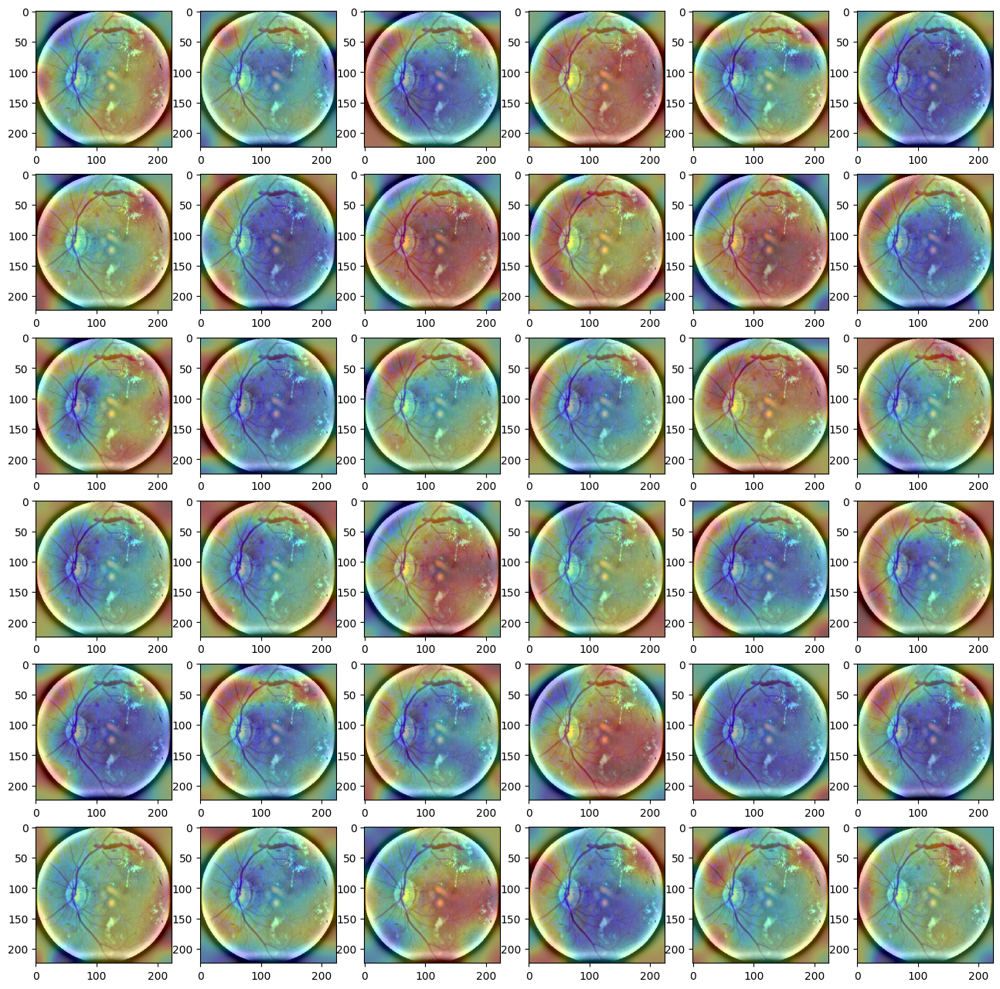

In [55]:
with tf.GradientTape() as tape:
    conv, pred = grad_model(X)
    loss = pred[:, 0]
print('Prediction shape:', pred.get_shape())
# Extract filters and gradients
# output = conv_outputs[0]
grads = tape.gradient(loss, pred)[0]
print(grads)

from scipy.ndimage import zoom
scale = 224 / 7
plt.figure(figsize=(16, 16))
for i in range(36):
    plt.subplot(6, 6, i + 1)
    plt.imshow(x_test[0])
    plt.imshow(zoom(conv[0, :,:,i], zoom=(scale, scale)), cmap='jet', alpha=0.3)

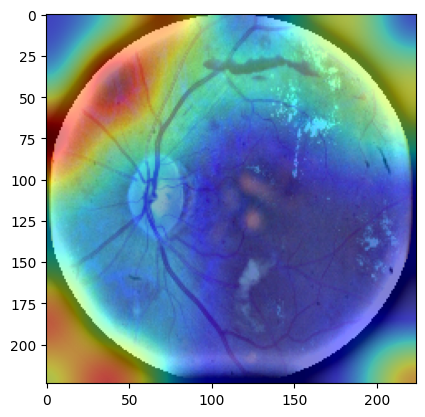

In [58]:
target = np.argmax(pred, axis=1).squeeze()
w, b = model.get_layer("dense_2").weights
weights = w[:, target].numpy()

heatmap = tf.squeeze(conv).numpy() @ weights
scale = 224 / 7
plt.figure()
plt.imshow(x_test[0])
plt.imshow(zoom(heatmap, zoom=(scale, scale)), cmap='jet', alpha=0.5)

## Evaluation: load model fine tuned EfficientNetB7

In [79]:
efficientnet_ = keras.applications.EfficientNetB7(weights = 'imagenet',include_top = False, input_shape = (224, 224, 3) )
x = global_average_pooling_layer(efficientnet_.layers[-1].output)
x = dropout_layer(x)
output = dense_layer(x)
model = keras.Model(efficientnet_.layers[0].input,output,name='EfficientNetB7')
model.compile(loss='binary_crossentropy', optimizer=keras.optimizers.Adam(lr=0.00005), metrics=['accuracy'])
model.load_weights(filepath="EfficientNetB7_weights.best.hdf5")

In [95]:
evaluation_result = model.evaluate(test_data)
# Display the evaluation result
print("Test Loss:", evaluation_result[0])
print("Test Accuracy:", evaluation_result[1])
y_pred = model.predict(test_data, batch_size = 8)

ytrain_EfficientNetB7 = test_prediction(y_pred)
print("First five data points predictions in training:",ytrain_EfficientNetB7[:5])
print("length of traindata prediction:",ytrain_EfficientNetB7.shape,"\n")

yvalidation_EfficientNetB7 = model.predict(x_validation)
yvalidation_EfficientNetB7 = test_prediction(yvalidation_EfficientNetB7)
print("First five data points predictions in validation:",yvalidation_EfficientNetB7[:5])
print("length of validation data prediction:",yvalidation_EfficientNetB7.shape,"\n")

ytest_EfficientNetB7 = model.predict(x_test)
ytest_EfficientNetB7 = test_prediction(ytest_EfficientNetB7)
print("First five data points predictions in test:",ytest_EfficientNetB7[:5])
print("length of test data prediction:",ytest_EfficientNetB7.shape)

63/63 [==============================] - 73s 1s/step - loss: 0.3488 - accuracy: 0.5380
Test Loss: 0.3487677276134491
Test Accuracy: 0.5379999876022339
63/63 [==============================] - 79s 1s/step
First five data points predictions in training: [0 4 0 3 0]
length of traindata prediction: (500,) 

20/20 [==============================] - 107s 5s/step
First five data points predictions in validation: [-1  1  1 -1  1]
length of validation data prediction: (612,) 

16/16 [==============================] - 83s 5s/step
First five data points predictions in test: [-1 -1 -1  2 -1]
length of test data prediction: (500,)


/tmp/ipykernel_18789/1139222585.py:21: RuntimeWarning: invalid value encountered in divide
  precision_matrix =(((matrix.T)/(matrix.sum(axis=1))).T)


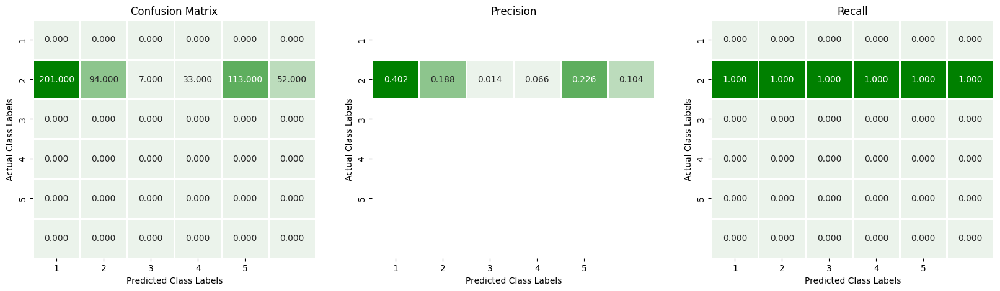

In [106]:
y_test = np.array(y_test)
y_pred = np.array(y_pred)
metric = PerformanceMetric(y_test, y_pred)
metric.plotting()

Prediction shape: (1, 5)
tf.Tensor([1. 0. 0. 0. 0.], shape=(5,), dtype=float32)


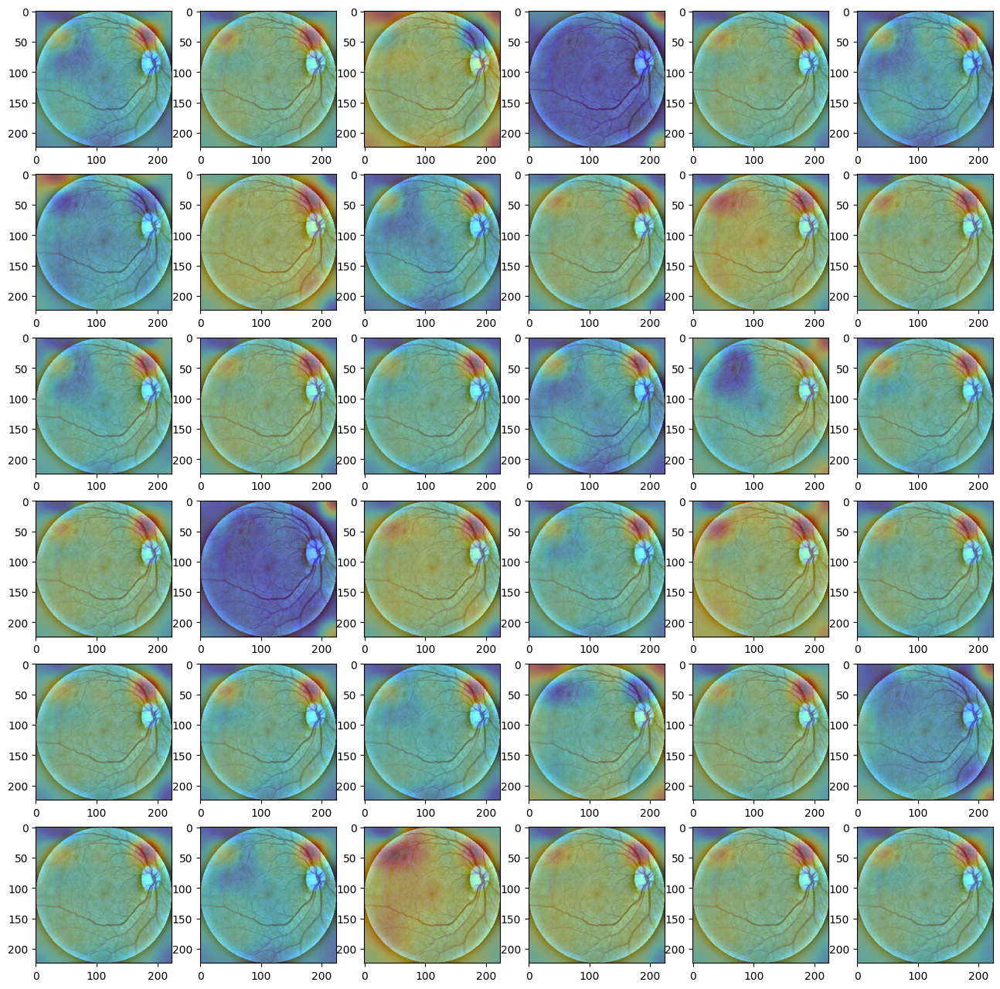

In [90]:
conv_output = model.get_layer("top_conv").output
pred_output = model.output


input_layer = model.input

# # Create a new model with these layers as outputs
grad_model = keras.Model(inputs=[model.input], outputs=[conv_output, pred_output])

X = np.expand_dims(x_test[10], axis=0).astype(np.float32)
X = preprocess_input(X)
with tf.GradientTape() as tape:
    conv, pred = grad_model(X)
    loss = pred[:, 0]
print('Prediction shape:', pred.get_shape())
# Extract filters and gradients
# output = conv_outputs[0]
grads = tape.gradient(loss, pred)[0]
print(grads)

from scipy.ndimage import zoom
scale = 224 / 7
plt.figure(figsize=(16, 16))
for i in range(36):
    plt.subplot(6, 6, i + 1)
    plt.imshow(x_test[10])
    plt.imshow(zoom(conv[0, :,:,i], zoom=(scale, scale)), cmap='jet', alpha=0.3)

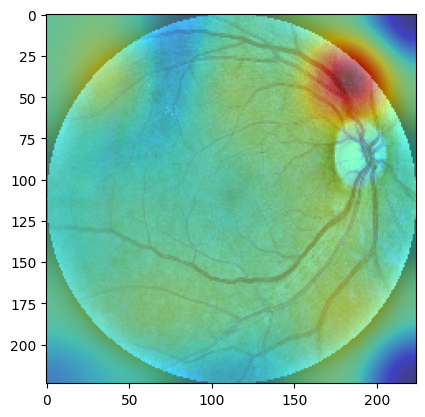

In [91]:
target = np.argmax(pred, axis=1).squeeze()
w, b = model.get_layer("dense_3").weights
weights = w[:, target].numpy()

heatmap = tf.squeeze(conv).numpy() @ weights
scale = 224 / 7
plt.figure()
plt.imshow(x_test[10])
plt.imshow(zoom(heatmap, zoom=(scale, scale)), cmap='jet', alpha=0.5)

## Vision Transformer model

In [ ]:
import torch
import torchvision

from torch import nn
from torchvision import transforms


In [ ]:
device = "cuda" if torch.cuda.is_available() else "cpu"
device

def set_seeds(seed: int=42):
    """Sets random sets for torch operations.

    Args:
        seed (int, optional): Random seed to set. Defaults to 42.
    """
    # Set the seed for general torch operations
    torch.manual_seed(seed)
    # Set the seed for CUDA torch operations (ones that happen on the GPU)
    torch.cuda.manual_seed(seed)

In [ ]:
# 1. Get pretrained weights for ViT-Base
pretrained_vit_weights = torchvision.models.ViT_B_16_Weights.DEFAULT

# 2. Setup a ViT model instance with pretrained weights
pretrained_vit = torchvision.models.vit_b_16(weights=pretrained_vit_weights).to(device)

# 3. Freeze the base parameters
for parameter in pretrained_vit.parameters():
    parameter.requires_grad = False

set_seeds()
pretrained_vit.heads = nn.Linear(in_features=768, out_features=5).to(device)
# pretrained_vit # uncomment for model output

In [ ]:
!pip install torchinfo

In [ ]:
from torchinfo import summary

# Print a summary using torchinfo (uncomment for actual output)
summary(model=pretrained_vit,
        input_size=(32, 3, 224, 224), # (batch_size, color_channels, height, width)
        # col_names=["input_size"], # uncomment for smaller output
        col_names=["input_size", "output_size", "num_params", "trainable"],
        col_width=20,
        row_settings=["var_names"]
)

Layer (type (var_name))                                      Input Shape          Output Shape         Param #              Trainable
VisionTransformer (VisionTransformer)                        [32, 3, 224, 224]    [32, 5]              768                  Partial
├─Conv2d (conv_proj)                                         [32, 3, 224, 224]    [32, 768, 14, 14]    (590,592)            False
├─Encoder (encoder)                                          [32, 197, 768]       [32, 197, 768]       151,296              False
│    └─Dropout (dropout)                                     [32, 197, 768]       [32, 197, 768]       --                   --
│    └─Sequential (layers)                                   [32, 197, 768]       [32, 197, 768]       --                   False
│    │    └─EncoderBlock (encoder_layer_0)                   [32, 197, 768]       [32, 197, 768]       (7,087,872)          False
│    │    └─EncoderBlock (encoder_layer_1)                   [32, 197, 768]       [32, 

In [ ]:
# Setup directory paths to train and test images
train_dir = 'DR_data_cropped_classes/train'
test_dir = 'DR_data_cropped_classes/test'

In [ ]:
# Get automatic transforms from pretrained ViT weights
pretrained_vit_transforms = pretrained_vit_weights.transforms()
print(pretrained_vit_transforms)

ImageClassification(
    crop_size=[224]
    resize_size=[256]
    mean=[0.485, 0.456, 0.406]
    std=[0.229, 0.224, 0.225]
    interpolation=InterpolationMode.BILINEAR
)


In [ ]:
import os

from torchvision import datasets, transforms
from torch.utils.data import DataLoader

NUM_WORKERS = os.cpu_count()

def create_dataloaders(
    train_dir: str,
    test_dir: str,
    transform: transforms.Compose,
    batch_size: int,
    num_workers: int=NUM_WORKERS
):

  # Use ImageFolder to create dataset(s)
  train_data = datasets.ImageFolder(train_dir, transform=transform)
  test_data = datasets.ImageFolder(test_dir, transform=transform)

  # Get class names
  class_names = train_data.classes

  # Turn images into data loaders
  train_dataloader = DataLoader(
      train_data,
      batch_size=batch_size,
      shuffle=True,
      num_workers=num_workers,
      pin_memory=True,
  )
  test_dataloader = DataLoader(
      test_data,
      batch_size=batch_size,
      shuffle=False,
      num_workers=num_workers,
      pin_memory=True,
  )

  return train_dataloader, test_dataloader, class_names

In [ ]:
# Setup dataloaders
train_dataloader_pretrained, test_dataloader_pretrained, class_names = create_dataloaders(train_dir=train_dir,
                                                                                                     test_dir=test_dir,
                                                                                                     transform=pretrained_vit_transforms,
                                                                                                     batch_size=32) # Could increase if we had more samples, such as here: https://arxiv.org/abs/2205.01580 (there are other improvements there too...)


In [ ]:
from tqdm.auto import tqdm
from typing import Dict, List, Tuple

def train_step(model: torch.nn.Module,
               dataloader: torch.utils.data.DataLoader,
               loss_fn: torch.nn.Module,
               optimizer: torch.optim.Optimizer,
               device: torch.device) -> Tuple[float, float]:
    """Trains a PyTorch model for a single epoch.

    Turns a target PyTorch model to training mode and then
    runs through all of the required training steps (forward
    pass, loss calculation, optimizer step).

    Args:
    model: A PyTorch model to be trained.
    dataloader: A DataLoader instance for the model to be trained on.
    loss_fn: A PyTorch loss function to minimize.
    optimizer: A PyTorch optimizer to help minimize the loss function.
    device: A target device to compute on (e.g. "cuda" or "cpu").

    Returns:
    A tuple of training loss and training accuracy metrics.
    In the form (train_loss, train_accuracy). For example:

    (0.1112, 0.8743)
    """
    # Put model in train mode
    model.train()

    # Setup train loss and train accuracy values
    train_loss, train_acc = 0, 0

    # Loop through data loader data batches
    for batch, (X, y) in enumerate(dataloader):
        # Send data to target device
        X, y = X.to(device), y.to(device)

        # 1. Forward pass
        y_pred = model(X)

        # 2. Calculate  and accumulate loss
        loss = loss_fn(y_pred, y)
        train_loss += loss.item()

        # 3. Optimizer zero grad
        optimizer.zero_grad()

        # 4. Loss backward
        loss.backward()

        # 5. Optimizer step
        optimizer.step()

        # Calculate and accumulate accuracy metric across all batches
        y_pred_class = torch.argmax(torch.softmax(y_pred, dim=1), dim=1)
        train_acc += (y_pred_class == y).sum().item()/len(y_pred)

    # Adjust metrics to get average loss and accuracy per batch
    train_loss = train_loss / len(dataloader)
    train_acc = train_acc / len(dataloader)
    return train_loss, train_acc

def test_step(model: torch.nn.Module,
              dataloader: torch.utils.data.DataLoader,
              loss_fn: torch.nn.Module,
              device: torch.device) -> Tuple[float, float]:
    """Tests a PyTorch model for a single epoch.

    Turns a target PyTorch model to "eval" mode and then performs
    a forward pass on a testing dataset.

    Args:
    model: A PyTorch model to be tested.
    dataloader: A DataLoader instance for the model to be tested on.
    loss_fn: A PyTorch loss function to calculate loss on the test data.
    device: A target device to compute on (e.g. "cuda" or "cpu").

    Returns:
    A tuple of testing loss and testing accuracy metrics.
    In the form (test_loss, test_accuracy). For example:

    (0.0223, 0.8985)
    """
    # Put model in eval mode
    model.eval()

    # Setup test loss and test accuracy values
    test_loss, test_acc = 0, 0

    # Turn on inference context manager
    with torch.inference_mode():
        # Loop through DataLoader batches
        for batch, (X, y) in enumerate(dataloader):
            # Send data to target device
            X, y = X.to(device), y.to(device)

            # 1. Forward pass
            test_pred_logits = model(X)

            # 2. Calculate and accumulate loss
            loss = loss_fn(test_pred_logits, y)
            test_loss += loss.item()

            # Calculate and accumulate accuracy
            test_pred_labels = test_pred_logits.argmax(dim=1)
            test_acc += ((test_pred_labels == y).sum().item()/len(test_pred_labels))

    # Adjust metrics to get average loss and accuracy per batch
    test_loss = test_loss / len(dataloader)
    test_acc = test_acc / len(dataloader)
    return test_loss, test_acc

def train(model: torch.nn.Module,
          train_dataloader: torch.utils.data.DataLoader,
          test_dataloader: torch.utils.data.DataLoader,
          optimizer: torch.optim.Optimizer,
          loss_fn: torch.nn.Module,
          epochs: int,
          device: torch.device) -> Dict[str, List]:
    """Trains and tests a PyTorch model.

    Passes a target PyTorch models through train_step() and test_step()
    functions for a number of epochs, training and testing the model
    in the same epoch loop.

    Calculates, prints and stores evaluation metrics throughout.

    Args:
    model: A PyTorch model to be trained and tested.
    train_dataloader: A DataLoader instance for the model to be trained on.
    test_dataloader: A DataLoader instance for the model to be tested on.
    optimizer: A PyTorch optimizer to help minimize the loss function.
    loss_fn: A PyTorch loss function to calculate loss on both datasets.
    epochs: An integer indicating how many epochs to train for.
    device: A target device to compute on (e.g. "cuda" or "cpu").

    Returns:
    A dictionary of training and testing loss as well as training and
    testing accuracy metrics. Each metric has a value in a list for
    each epoch.
    In the form: {train_loss: [...],
              train_acc: [...],
              test_loss: [...],
              test_acc: [...]}
    For example if training for epochs=2:
             {train_loss: [2.0616, 1.0537],
              train_acc: [0.3945, 0.3945],
              test_loss: [1.2641, 1.5706],
              test_acc: [0.3400, 0.2973]}
    """
    # Create empty results dictionary
    results = {"train_loss": [],
               "train_acc": [],
               "test_loss": [],
               "test_acc": []
    }

    # Make sure model on target device
    model.to(device)

    # Loop through training and testing steps for a number of epochs
    for epoch in tqdm(range(epochs)):
        train_loss, train_acc = train_step(model=model,
                                          dataloader=train_dataloader,
                                          loss_fn=loss_fn,
                                          optimizer=optimizer,
                                          device=device)
        test_loss, test_acc = test_step(model=model,
          dataloader=test_dataloader,
          loss_fn=loss_fn,
          device=device)

        # Print out what's happening
        print(
          f"Epoch: {epoch+1} | "
          f"train_loss: {train_loss:.4f} | "
          f"train_acc: {train_acc:.4f} | "
          f"test_loss: {test_loss:.4f} | "
          f"test_acc: {test_acc:.4f}"
        )

        # Update results dictionary
        results["train_loss"].append(train_loss)
        results["train_acc"].append(train_acc)
        results["test_loss"].append(test_loss)
        results["test_acc"].append(test_acc)

    # Return the filled results at the end of the epochs
    return results

In [ ]:
# Create optimizer and loss function
optimizer = torch.optim.Adam(params=pretrained_vit.parameters(),
                             lr=1e-3)
loss_fn = torch.nn.CrossEntropyLoss()

# Train the classifier head of the pretrained ViT feature extractor model
set_seeds()
pretrained_vit_results = train(model=pretrained_vit,
                                      train_dataloader=train_dataloader_pretrained,
                                      test_dataloader=test_dataloader_pretrained,
                                      optimizer=optimizer,
                                      loss_fn=loss_fn,
                                      epochs=20,
                                      device=device)

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.4053 | train_acc: 0.3669 | test_loss: 1.3402 | test_acc: 0.3578
Epoch: 2 | train_loss: 1.2667 | train_acc: 0.4443 | test_loss: 1.2875 | test_acc: 0.4359
Epoch: 3 | train_loss: 1.2204 | train_acc: 0.4675 | test_loss: 1.2539 | test_acc: 0.4227
Epoch: 4 | train_loss: 1.1921 | train_acc: 0.4805 | test_loss: 1.2427 | test_acc: 0.4215
Epoch: 5 | train_loss: 1.1719 | train_acc: 0.4941 | test_loss: 1.2145 | test_acc: 0.4523
Epoch: 6 | train_loss: 1.1595 | train_acc: 0.4956 | test_loss: 1.2245 | test_acc: 0.4500
Epoch: 7 | train_loss: 1.1341 | train_acc: 0.5139 | test_loss: 1.2041 | test_acc: 0.4621
Epoch: 8 | train_loss: 1.1184 | train_acc: 0.5229 | test_loss: 1.2083 | test_acc: 0.4551
Epoch: 9 | train_loss: 1.1056 | train_acc: 0.5315 | test_loss: 1.2311 | test_acc: 0.4258
Epoch: 10 | train_loss: 1.0956 | train_acc: 0.5369 | test_loss: 1.2026 | test_acc: 0.4559
Epoch: 11 | train_loss: 1.0907 | train_acc: 0.5413 | test_loss: 1.2462 | test_acc: 0.4437
Epoch: 12 | train_l

In [ ]:
def plot_loss_curves(results):
    loss = results["train_loss"]
    test_loss = results["test_loss"]

    accuracy = results["train_acc"]
    test_accuracy = results["test_acc"]

    epochs = range(len(results["train_loss"]))

    plt.figure(figsize=(15, 7))

    # Plot loss
    plt.subplot(1, 2, 1)
    plt.plot(epochs, loss, label="train_loss")
    plt.plot(epochs, test_loss, label="test_loss")
    plt.title("Loss")
    plt.xlabel("Epochs")
    plt.legend()

    # Plot accuracy
    plt.subplot(1, 2, 2)
    plt.plot(epochs, accuracy, label="train_accuracy")
    plt.plot(epochs, test_accuracy, label="test_accuracy")
    plt.title("Accuracy")
    plt.xlabel("Epochs")
    plt.legend()

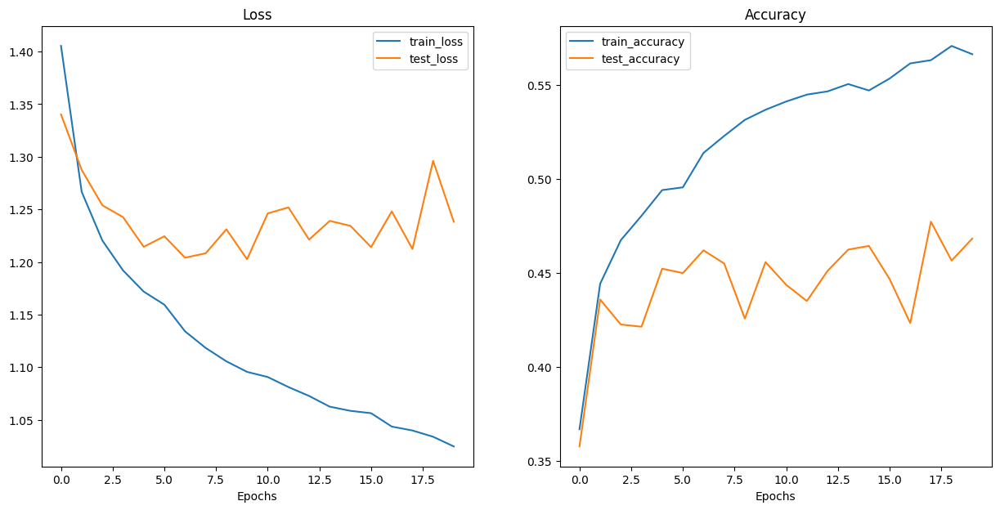

In [ ]:
plot_loss_curves(pretrained_vit_results)

In [ ]:
from typing import List, Tuple

from PIL import Image


def pred_and_plot_image(
    model: torch.nn.Module,
    class_names: List[str],
    image_path: str,
    image_size: Tuple[int, int] = (224, 224),
    transform: torchvision.transforms = None,
    device: torch.device = device,
):
    """Predicts on a target image with a target model.

    Args:
        model (torch.nn.Module): A trained (or untrained) PyTorch model to predict on an image.
        class_names (List[str]): A list of target classes to map predictions to.
        image_path (str): Filepath to target image to predict on.
        image_size (Tuple[int, int], optional): Size to transform target image to. Defaults to (224, 224).
        transform (torchvision.transforms, optional): Transform to perform on image. Defaults to None which uses ImageNet normalization.
        device (torch.device, optional): Target device to perform prediction on. Defaults to device.
    """

    # Open image
    img = Image.open(image_path)

    # Create transformation for image (if one doesn't exist)
    if transform is not None:
        image_transform = transform
    else:
        image_transform = transforms.Compose(
            [
                transforms.Resize(image_size),
                transforms.ToTensor(),
                transforms.Normalize(
                    mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]
                ),
            ]
        )

    ### Predict on image ###

    # Make sure the model is on the target device
    model.to(device)

    # Turn on model evaluation mode and inference mode
    model.eval()
    with torch.inference_mode():
        # Transform and add an extra dimension to image (model requires samples in [batch_size, color_channels, height, width])
        transformed_image = image_transform(img).unsqueeze(dim=0)

        # Make a prediction on image with an extra dimension and send it to the target device
        target_image_pred = model(transformed_image.to(device))

    # Convert logits -> prediction probabilities (using torch.softmax() for multi-class classification)
    target_image_pred_probs = torch.softmax(target_image_pred, dim=1)

    # Convert prediction probabilities -> prediction labels
    target_image_pred_label = torch.argmax(target_image_pred_probs, dim=1)

    # Plot image with predicted label and probability
    plt.figure()
    plt.imshow(img)
    plt.title(
        f"Pred: {class_names[target_image_pred_label]} | Prob: {target_image_pred_probs.max():.3f}"
    )
    plt.axis(False)


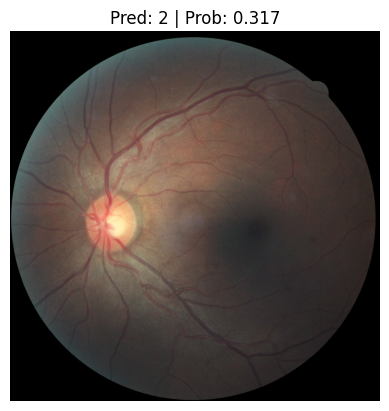

In [ ]:
# Setup custom image path
custom_image_path = "DR_data_cropped_classes/test/0/1012_left.jpeg"

# Predict on custom image
pred_and_plot_image(model=pretrained_vit,
                    image_path=custom_image_path,
                    class_names=class_names)

In [ ]:
file_path = 'ViT.pth'
torch.save(pretrained_vit.state_dict(),file_path)

In [1]:
!pip install pydub

In [2]:
from pydub import AudioSegment
import os

def split_wav(input_file, output_folder):
    # Load the input WAV file
    audio = AudioSegment.from_wav(input_file)

    # Calculate the duration of 10 minutes in milliseconds
    ten_minutes = 10 * 60 * 1000

    # Calculate the number of segments
    num_segments = len(audio) // ten_minutes

    # Create the output folder if it doesn't exist
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)

    # Split the audio into 10-minute segments
    for i in range(num_segments):
        start_time = i * ten_minutes
        end_time = (i + 1) * ten_minutes

        # Extract the segment
        segment = audio[start_time:end_time]

        # Save the segment to a new WAV file
        output_file = os.path.join(output_folder, f"segment_{i + 1}.wav")
        segment.export(output_file, format="wav")
        print(f"Segment {i + 1} saved to {output_file}")

if __name__ == "__main__":
    input_wav_file = "/home/moe/Downloads/New Recording 16.wav"
    output_folder = "output_folder_2"

    split_wav(input_wav_file, output_folder)


/home/moe/anaconda3/lib/python3.11/site-packages/pydub/utils.py:170: RuntimeWarning: Couldn't find ffmpeg or avconv - defaulting to ffmpeg, but may not work
  warn("Couldn't find ffmpeg or avconv - defaulting to ffmpeg, but may not work", RuntimeWarning)


Segment 1 saved to output_folder_2/segment_1.wav
Segment 2 saved to output_folder_2/segment_2.wav
Segment 3 saved to output_folder_2/segment_3.wav
Segment 4 saved to output_folder_2/segment_4.wav


In [1]:
!pip install requests
!pip install beautifulsoup4

In [10]:
import requests
from bs4 import BeautifulSoup

def scrape_website(url):
    # Send a GET request to the URL
    response = requests.get(url)

    # Check if the request was successful (status code 200)
    if response.status_code == 200:
        # Parse the HTML content of the page
        soup = BeautifulSoup(response.text, 'html.parser')

        # Example: Extracting text from all elements with a class attribute
        elements_with_class = soup.find_all(class_=True)
        
        for element in elements_with_class:
            print(element.text)
            print(element)

        # You can customize this part based on the structure of the website

    else:
        print(f"Failed to retrieve the page. Status code: {response.status_code}")

if __name__ == "__main__":
    # Replace 'https://example.com' with the URL of the website you want to scrape
    website_url = 'https://mebix.de'
    scrape_website(website_url)






mebix – Der digitale Therapiebegleiter zur Behandlung von Diabetes 2.





















































Zum Inhalt springen

















Start
Funktionen
Support
Fachkreise
Rezept-Service
 



Jetzt starten

























Menü ein-/ausklappen























Die Diabetes DiGA App auf Rezept
Kleine Schritte – große Wirkung
mebix, der digitale Therapiebegleiter, hilft Menschen mit Diabetes Typ-2, ihre Therapieziele leichter zu erreichen.


Jetzt starten
Kostenfrei auf Rezept










Warum mebix?
Erklärvideo ansehen











So einfach wie ein Merkzettel am   Kühlschrank

Schritt für Schritt werden Sie durch die App geleitet
Tagesaufgaben werden als farbige Balken dargestellt 
Jede Aufgabe ist mit einem Klick erreichbar  
Erledigte Aufgaben verschwinden von der Startseite  
Kein farbiger Balken – keine Tagesaufgaben 













Entspannt informiert und im Alltag begleitet

In unterhaltsamen Videos erfahren Sie mehr zu den Hintergründen und

None
